<a href="https://www.kaggle.com/code/utkarshx27/co2-emissions-eda-and-prediction?scriptVersionId=138674867" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# <div style="padding: 40px;color:white;margin:10;font-size:90%;text-align:center;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://cms.bbcearth.com/sites/default/files/2020-09/Rectangle%209.jpg)"><b><span style='color:white'>CO2 Emissions: EDA and Prediction</span></b> </div>
***

<div style="width:100%;text-align:center"> 
<img align=middle src = "https://www.innovationnewsnetwork.com/wp-content/uploads/2022/11/%C2%A9-iStockPetmal-1340519929-800x450.jpg" width="700px">
</div>

# Overview:

The challenge involves predicting carbon emissions using open-source emissions data obtained from Sentinel-5P satellite observations. The dataset consists of approximately 497 unique locations in Rwanda, with observations spanning from January 2019 to November 2022. The data is split into training and test sets, with the training data containing observations from 2019 to 2021, and the goal is to predict the CO2 emissions data for the year 2022 through November.

The dataset contains seven main features obtained weekly from Sentinel-5P observations. These features are:

1. Sulphur Dioxide (SO2): It includes sub-features such as column_number_density, which represents the vertical column density at ground level, calculated using the DOAS technique.

2. Carbon Monoxide (CO): Similar to SO2, it includes sub-features like column_number_density.

3. Nitrogen Dioxide (NO2): It also includes sub-features such as column_number_density.

4. Formaldehyde (HCHO): Contains sub-features like column_number_density.

5. UV Aerosol Index (AER_AI): Represents the UV aerosol index at the observed locations.

6. Ozone (O3): Includes sub-features such as column_number_density.

7. Cloud (CLOUD): Represents cloud data at the observed locations.

The task is to build machine learning models that use this satellite observations data to predict the CO2 emissions data for the year 2022 through November. The time information and the various features provided are used to make these predictions.

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
import folium
import geopandas as gpd
import plotly.graph_objects as go
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

train = pd.read_csv('/kaggle/input/playground-series-s3e20/train.csv').drop('ID_LAT_LON_YEAR_WEEK', axis =1)
test = pd.read_csv('/kaggle/input/playground-series-s3e20/test.csv').drop('ID_LAT_LON_YEAR_WEEK', axis =1)
sub = pd.read_csv('/kaggle/input/playground-series-s3e20/sample_submission.csv')

In [15]:
train.head()

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,50.843559,...,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
1,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,39.137194,...,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
2,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,52.868816,...,4216.986492,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381
3,-0.51,29.29,2019,3,NaN,NaN,NaN,NaN,NaN,NaN,...,5228.507736,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286
4,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,35.515587,...,3980.598120,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317


# Data Statistical Overview:

In [16]:
def summary(df):
    print(f'data shape: {df.shape}')
    summ = pd.DataFrame(df.dtypes, columns=['data type'])
    summ['missing'] = df.isnull().sum().values
    summ['missing[%]'] = df.isnull().sum().values / len(df) * 100
    summ['unique'] = df.nunique().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    summ['median'] = df.median().values
    summ['std'] = df.std().values

    numeric_columns = df.select_dtypes(include=np.number).columns
    for col in numeric_columns:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]
        summ.loc[col, 'outliers'] = outliers.count()
        summ.loc[col, 'lower_bound'] = lower_bound
        summ.loc[col, 'upper_bound'] = upper_bound

    return summ

summary(train)

data shape: (79023, 75)


,data type,missing,missing[%],unique,min,max,median,std,outliers,lower_bound,upper_bound
latitude,float64,0,0.000000,452,-3.299000,-0.510000,-1.882000,0.694522,0.0,-4.173000,0.419000
longitude,float64,0,0.000000,453,28.228000,31.532000,29.883000,0.810375,0.0,27.448500,32.284500
year,int64,0,0.000000,3,2019.000000,2021.000000,2020.000000,0.816502,0.0,2016.000000,2024.000000
week_no,int64,0,0.000000,53,0.000000,52.000000,26.000000,15.297155,0.0,-26.000000,78.000000
SulphurDioxide_SO2_column_number_density,float64,14609,18.487023,64409,-0.000996,0.004191,0.000024,0.000272,3357.0,-0.000469,0.000526
...,...,...,...,...,...,...,...,...,...,...,...
Cloud_sensor_azimuth_angle,float64,484,0.612480,78538,-102.739731,78.223037,-12.673914,30.374462,1459.0,-89.876227,68.969259
Cloud_sensor_zenith_angle,float64,484,0.612480,78539,2.998873,65.951248,41.119630,6.428216,1396.0,22.905359,57.370820
Cloud_solar_azimuth_angle,float64,484,0.612480,78539,-153.464211,-22.653170,-84.644352,37.837269,0.0,-242.778845,68.654985
Cloud_solar_zenith_angle,float64,484,0.612480,78539,10.818288,42.060436,28.333630,4.403835,21.0,14.467084,41.719563


# Clustermap - Correlation Matrix:

<Figure size 1200x1000 with 0 Axes>

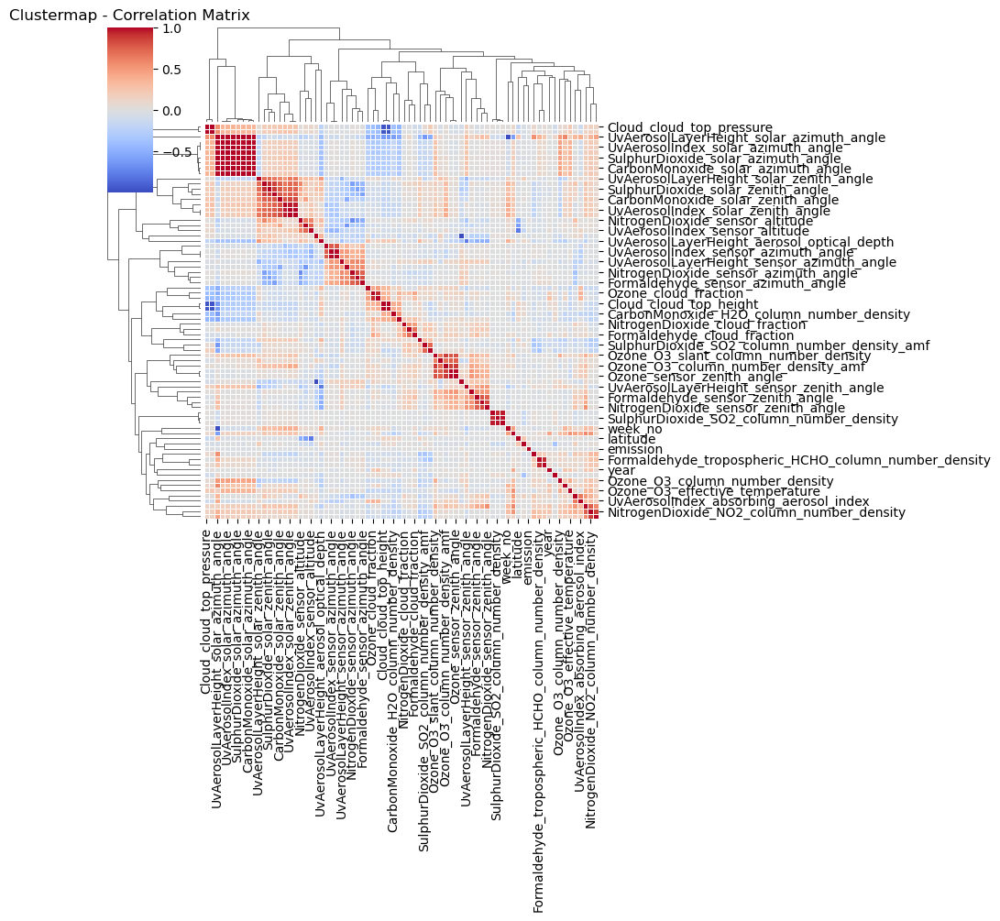

In [30]:
correlation_matrix = train.corr()
correlation_matrix.fillna(0, inplace=True)

plt.figure(figsize=(12, 10))
sns.clustermap(correlation_matrix, cmap='coolwarm', linewidths=0.5)
plt.title("Clustermap - Correlation Matrix")
plt.show()

# Geospatial Clusters:

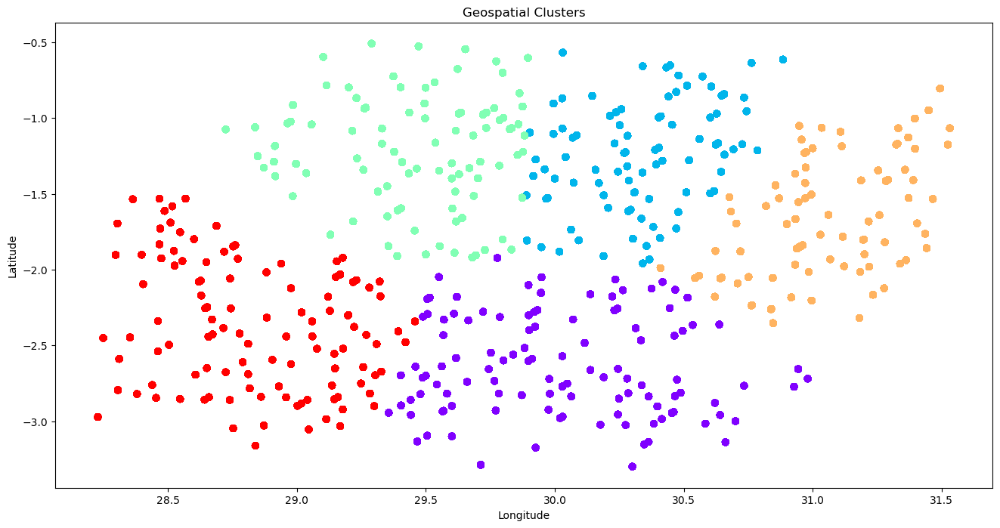

In [18]:
coordinates = train[['latitude', 'longitude']]
num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
train['cluster_label'] = kmeans.fit_predict(coordinates)

plt.figure(figsize=(16, 8))
plt.scatter(coordinates['longitude'], coordinates['latitude'], c=train['cluster_label'], cmap='rainbow')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geospatial Clusters')
plt.show()

# SO2 Density Plot and Distribution:

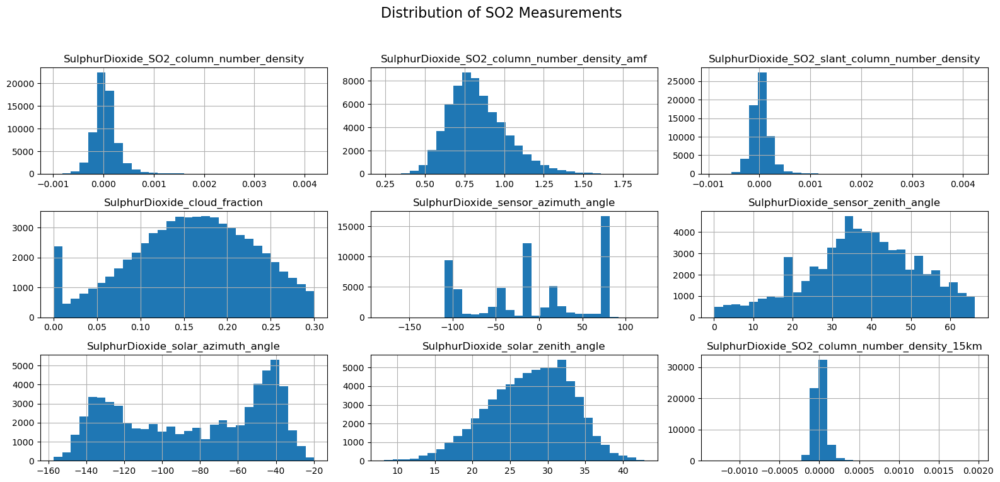

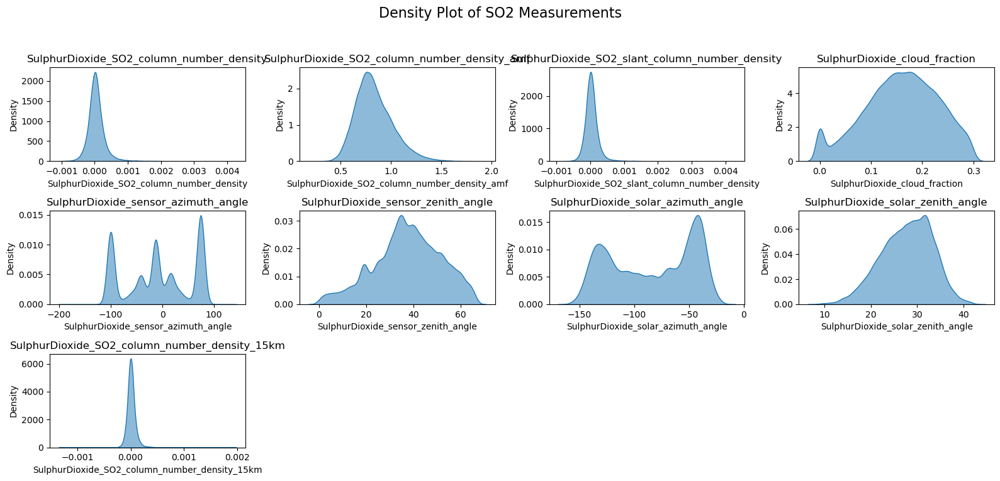

In [19]:
so_columns = ['SulphurDioxide_SO2_column_number_density',
               'SulphurDioxide_SO2_column_number_density_amf',
               'SulphurDioxide_SO2_slant_column_number_density',
               'SulphurDioxide_cloud_fraction',
               'SulphurDioxide_sensor_azimuth_angle',
               'SulphurDioxide_sensor_zenith_angle',
               'SulphurDioxide_solar_azimuth_angle',
               'SulphurDioxide_solar_zenith_angle',
               'SulphurDioxide_SO2_column_number_density_15km']


so_data = train[so_columns]

so_data.hist(bins=30, figsize=(16, 8))
plt.suptitle('Distribution of SO2 Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

plt.figure(figsize=(16, 8))
num_columns = len(so_data.columns)
num_rows = (num_columns + 3) // 4  
for i, col in enumerate(so_data.columns):
    plt.subplot(num_rows, 4, i+1)
    sns.kdeplot(train[col], fill=True, alpha=0.5)
    plt.title(col)
plt.suptitle('Density Plot of SO2 Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# CO Density Plot and Distribution:

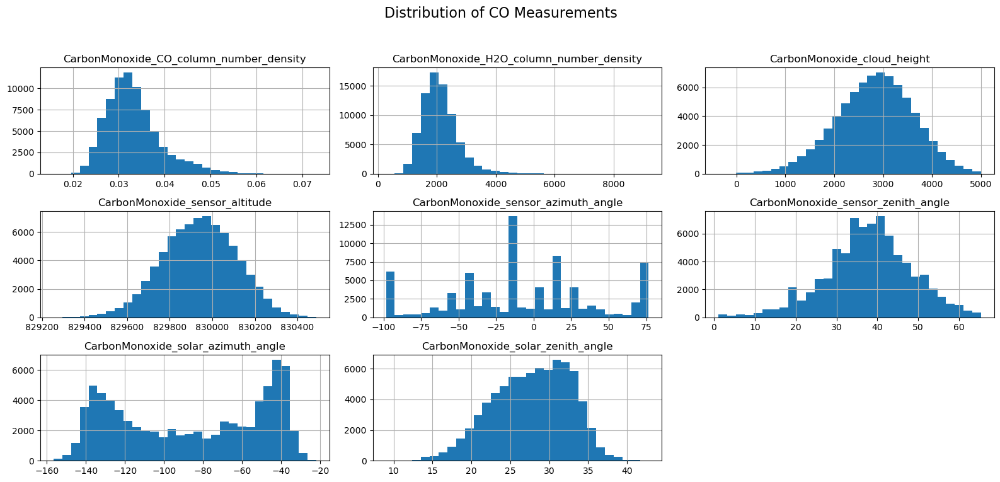

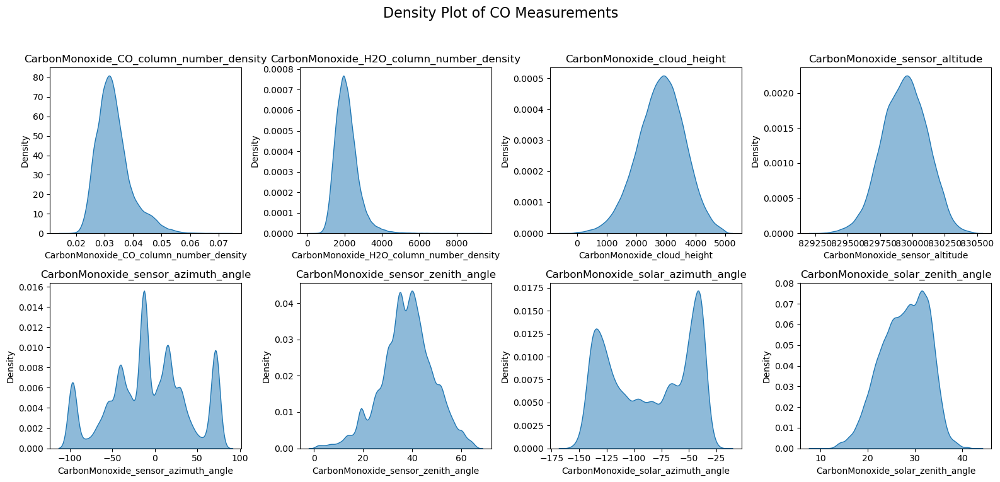

In [20]:
co_columns = ['CarbonMonoxide_CO_column_number_density',
              'CarbonMonoxide_H2O_column_number_density',
              'CarbonMonoxide_cloud_height',
              'CarbonMonoxide_sensor_altitude',
              'CarbonMonoxide_sensor_azimuth_angle',
              'CarbonMonoxide_sensor_zenith_angle',
              'CarbonMonoxide_solar_azimuth_angle',
              'CarbonMonoxide_solar_zenith_angle']


co_data = train[co_columns]

co_data.hist(bins=30, figsize=(16, 8))
plt.suptitle('Distribution of CO Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

plt.figure(figsize=(16, 8))
for i, col in enumerate(co_data.columns):
    plt.subplot(2, 4, i+1)
    sns.kdeplot(train[col], fill=True, alpha=0.5)
    plt.title(col)
plt.suptitle('Density Plot of CO Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Cloud Measurments Pair Plot:

/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



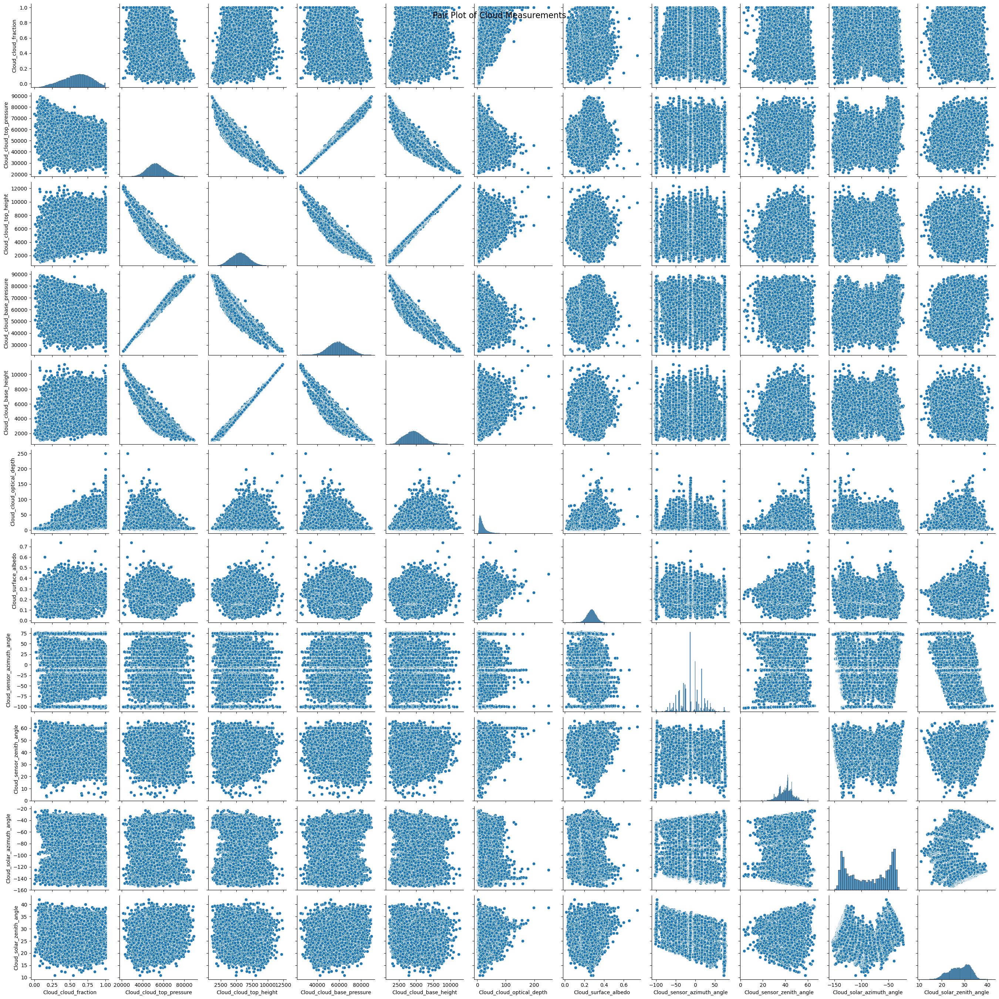

In [21]:
cloud_columns = ['Cloud_cloud_fraction',
                 'Cloud_cloud_top_pressure',
                 'Cloud_cloud_top_height',
                 'Cloud_cloud_base_pressure',
                 'Cloud_cloud_base_height',
                 'Cloud_cloud_optical_depth',
                 'Cloud_surface_albedo',
                 'Cloud_sensor_azimuth_angle',
                 'Cloud_sensor_zenith_angle',
                 'Cloud_solar_azimuth_angle',
                 'Cloud_solar_zenith_angle']

cloud_data = train[cloud_columns]

sns.pairplot(cloud_data)
plt.suptitle('Pair Plot of Cloud Measurements', fontsize=16)
plt.show()

# UV Aerosol Index Density Plot and Distribution:

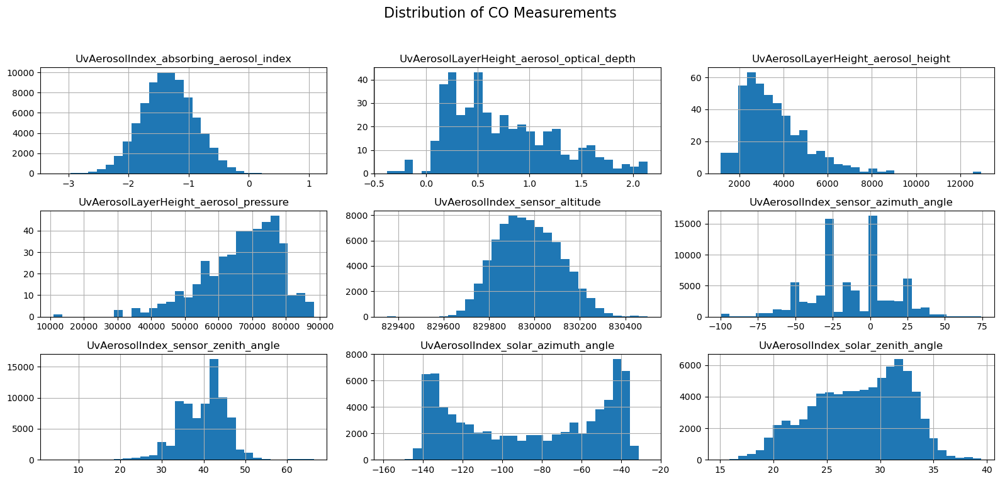

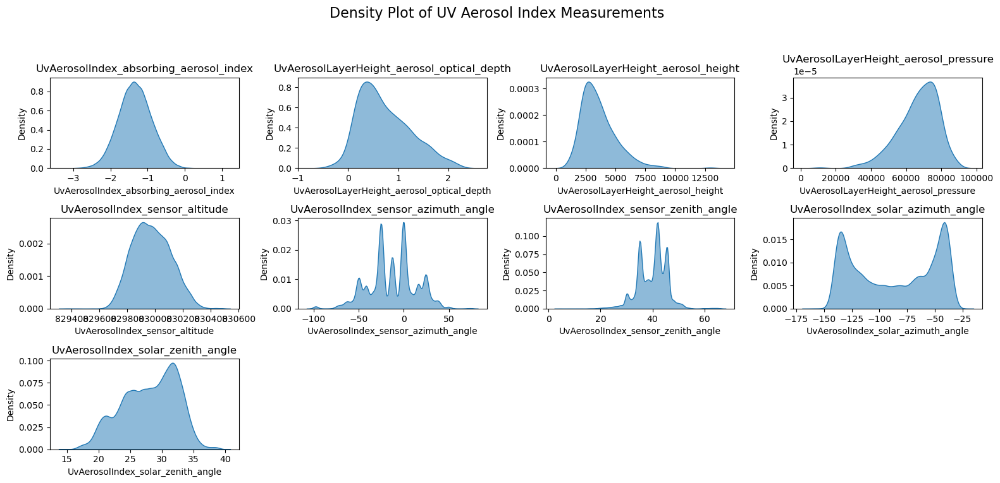

In [22]:
uvai_columns = ['UvAerosolIndex_absorbing_aerosol_index',
                'UvAerosolLayerHeight_aerosol_optical_depth',
                'UvAerosolLayerHeight_aerosol_height',
                'UvAerosolLayerHeight_aerosol_pressure',
                'UvAerosolIndex_sensor_altitude',
                'UvAerosolIndex_sensor_azimuth_angle',
                'UvAerosolIndex_sensor_zenith_angle',
                'UvAerosolIndex_solar_azimuth_angle',
                'UvAerosolIndex_solar_zenith_angle']

uvai_data = train[uvai_columns]

uvai_data.hist(bins=30, figsize=(16, 8))
plt.suptitle('Distribution of CO Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

plt.figure(figsize=(16, 8))
num_columns = len(uvai_data.columns)
num_rows = (num_columns + 3) // 4
for i, col in enumerate(uvai_data.columns):
    plt.subplot(num_rows, 4, i+1)
    sns.kdeplot(train[col], fill=True, alpha=0.5)
    plt.title(col)
plt.suptitle('Density Plot of UV Aerosol Index Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# NO2 Density Plot and Distribution:

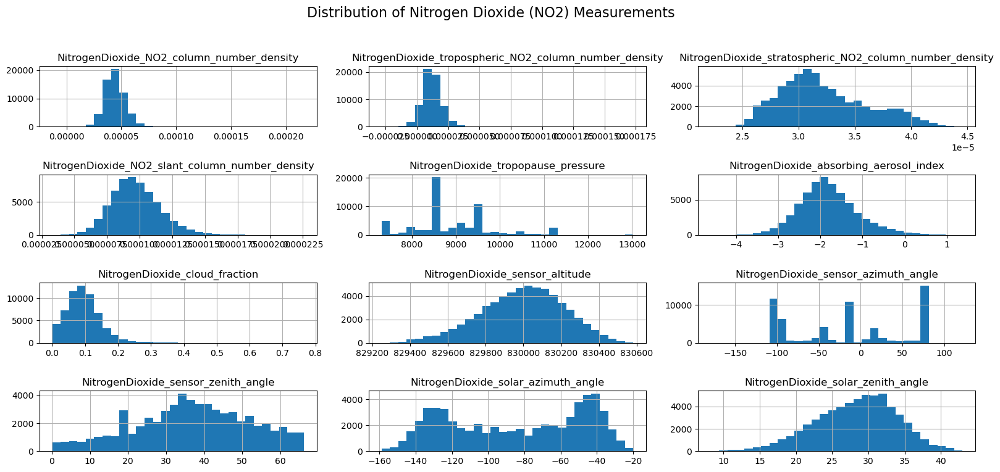

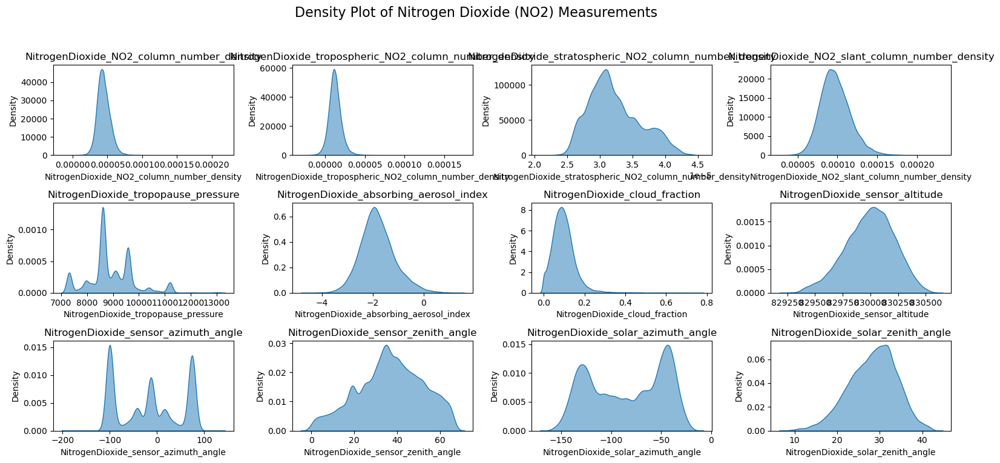

In [23]:
no2_columns = ['NitrogenDioxide_NO2_column_number_density',
               'NitrogenDioxide_tropospheric_NO2_column_number_density',
               'NitrogenDioxide_stratospheric_NO2_column_number_density',
               'NitrogenDioxide_NO2_slant_column_number_density',
               'NitrogenDioxide_tropopause_pressure',
               'NitrogenDioxide_absorbing_aerosol_index',
               'NitrogenDioxide_cloud_fraction',
               'NitrogenDioxide_sensor_altitude',
               'NitrogenDioxide_sensor_azimuth_angle',
               'NitrogenDioxide_sensor_zenith_angle',
               'NitrogenDioxide_solar_azimuth_angle',
               'NitrogenDioxide_solar_zenith_angle']

no2_data = train[no2_columns]

no2_data.hist(bins=30, figsize=(16, 8))
plt.suptitle('Distribution of Nitrogen Dioxide (NO2) Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

plt.figure(figsize=(16, 8))
num_columns = len(no2_data.columns)
num_rows = (num_columns + 3) // 4
for i, col in enumerate(no2_data.columns):
    plt.subplot(num_rows, 4, i+1)
    sns.kdeplot(train[col], fill=True, alpha=0.5)
    plt.title(col)
plt.suptitle('Density Plot of Nitrogen Dioxide (NO2) Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Formaldehyde (HCHO) Density Plot and Distribution:

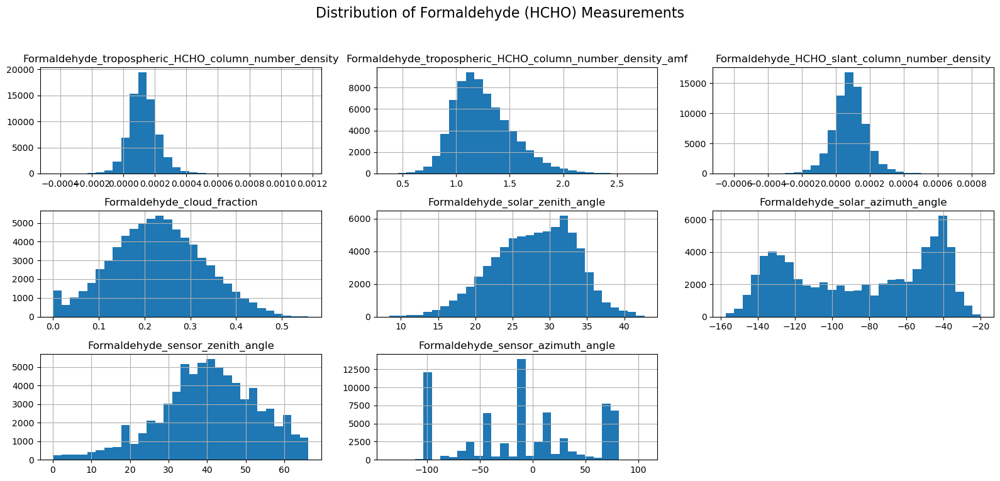

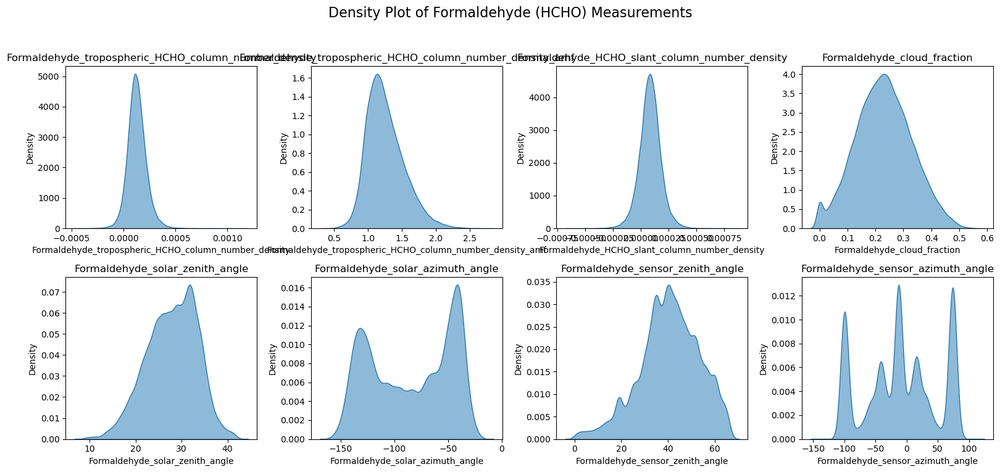

In [24]:
hcho_columns = ['Formaldehyde_tropospheric_HCHO_column_number_density',
                'Formaldehyde_tropospheric_HCHO_column_number_density_amf',
                'Formaldehyde_HCHO_slant_column_number_density',
                'Formaldehyde_cloud_fraction',
                'Formaldehyde_solar_zenith_angle',
                'Formaldehyde_solar_azimuth_angle',
                'Formaldehyde_sensor_zenith_angle',
                'Formaldehyde_sensor_azimuth_angle']


hcho_data = train[hcho_columns]

hcho_data.hist(bins=30, figsize=(16, 8))
plt.suptitle('Distribution of Formaldehyde (HCHO) Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

plt.figure(figsize=(16, 8))
num_columns = len(hcho_data.columns)
num_rows = (num_columns + 3) // 4
for i, col in enumerate(hcho_data.columns):
    plt.subplot(num_rows, 4, i+1)
    sns.kdeplot(train[col], fill=True, alpha=0.5)
    plt.title(col)
plt.suptitle('Density Plot of Formaldehyde (HCHO) Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Ozone (O3) Density Plot and Distribution:

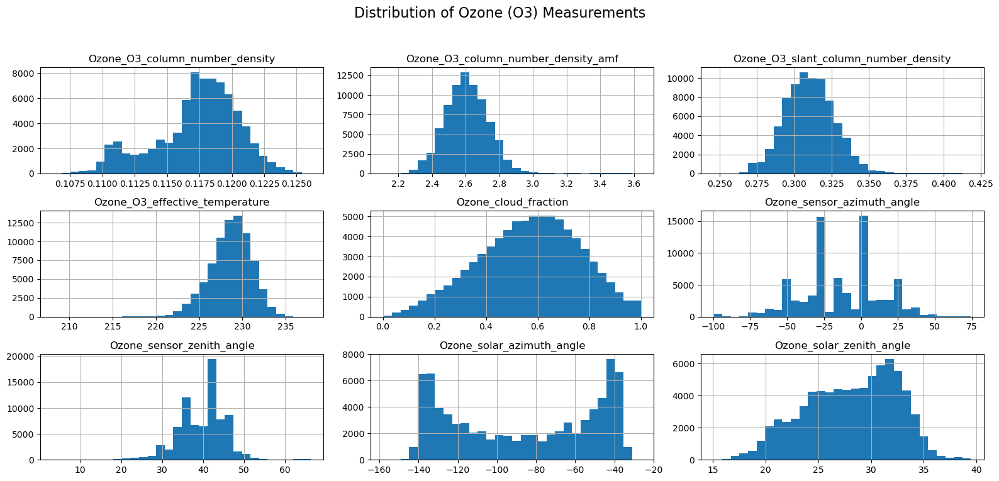

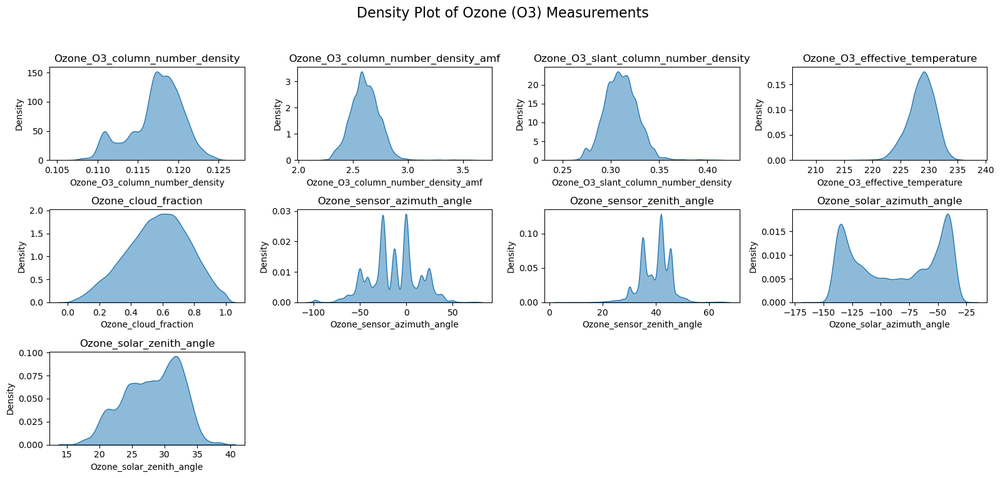

In [25]:
ozone_columns = ['Ozone_O3_column_number_density',
                 'Ozone_O3_column_number_density_amf',
                 'Ozone_O3_slant_column_number_density',
                 'Ozone_O3_effective_temperature',
                 'Ozone_cloud_fraction',
                 'Ozone_sensor_azimuth_angle',
                 'Ozone_sensor_zenith_angle',
                 'Ozone_solar_azimuth_angle',
                 'Ozone_solar_zenith_angle']

ozone_data = train[ozone_columns]

ozone_data.hist(bins=30, figsize=(16, 8))
plt.suptitle('Distribution of Ozone (O3) Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

plt.figure(figsize=(16, 8))
num_columns = len(ozone_data.columns)
num_rows = (num_columns + 3) // 4
for i, col in enumerate(ozone_data.columns):
    plt.subplot(num_rows, 4, i+1)
    sns.kdeplot(train[col], fill=True, alpha=0.5)
    plt.title(col)
plt.suptitle('Density Plot of Ozone (O3) Measurements', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Geo visualization

In [26]:
train_coords = train.drop_duplicates(subset=['latitude', 'longitude']).copy()
test_coords = test.drop_duplicates(subset=['latitude', 'longitude']).copy()

train_coords.loc[:, 'set_type'] = 'train'
test_coords.loc[:, 'set_type'] = 'test'

all_data = pd.concat([train_coords, test_coords], ignore_index=True)
geometry = gpd.points_from_xy(all_data.longitude, all_data.latitude)
geo_df = gpd.GeoDataFrame(all_data[["latitude", "longitude", "set_type"]], geometry=geometry)

all_data_map = folium.Map(prefer_canvas=True, zoom_start=10)

train_color = "green"
test_color = "orange"

for index, row in geo_df.iterrows():
    coordinates = [row['latitude'], row['longitude']]
    popup_content = f"Coordinates: {coordinates}<br>Set: {row['set_type']}"
    

    folium.CircleMarker(
        location=coordinates,
        radius=4, 
        weight=2,
        popup=popup_content,
        color=train_color if row['set_type'] == "train" else test_color,
        fill=True,
        fill_opacity=0.7,
    ).add_to(all_data_map)

legend_html = """
    <div style="position: fixed; bottom: 50px; left: 50px; z-index: 1000; padding: 10px; background-color: white; border: 1px solid grey;">
      <p><span style="background-color: green; border-radius: 50%; padding: 5px;"></span> Train Set</p>
      <p><span style="background-color: orange; border-radius: 50%; padding: 5px;"></span> Test Set</p>
    </div>
    """
all_data_map.get_root().html.add_child(folium.Element(legend_html))

all_data_map

# Emissions by Year and Week Number:

In [27]:
fig = px.bar(train, x='year', y='emission', color='week_no',
             labels={'year': 'Year', 'emission': 'Emission', 'week_no': 'Week Number'},
             title='Emissions by Year and Week Number')
fig.show()

# Emission vs. Sulphur Dioxide by Year:

In [28]:
fig = px.scatter(train, x='year', y='SulphurDioxide_SO2_column_number_density', color='week_no',
                 labels={'year': 'Year', 'SulphurDioxide_SO2_column_number_density': 'Sulphur Dioxide'},
                 title='Emission vs. Sulphur Dioxide by Year')
fig.show()

# Weekly Carbon Emissions:

In [36]:
weekly_emissions = pd.DataFrame({
    'date': pd.date_range(start='2019-01-01', periods=156, freq='W'),
    'year': [2019]*52 + [2020]*52 + [2021]*52,
    'SulphurDioxide': [0.5]*52 + [0.4]*52 + [0.3]*52,
    'CarbonMonoxide': [1.2]*52 + [1.0]*52 + [0.8]*52,
    'NitrogenDioxide': [0.7]*52 + [0.6]*52 + [0.5]*52,
    'Formaldehyde': [0.3]*52 + [0.2]*52 + [0.1]*52
})

fig = go.Figure()

pollutant_groups = ['SulphurDioxide', 'CarbonMonoxide', 'NitrogenDioxide', 'Formaldehyde']
for pollutant in pollutant_groups:
    fig.add_trace(go.Scatter(x=weekly_emissions['date'], y=weekly_emissions[pollutant], mode='lines', name=pollutant))
fig.update_layout(
    title_text='Weekly Carbon Emissions by Year for Each Pollutant Group',
    xaxis=dict(
        title='Date',
        titlefont_size=16,
    ),
    yaxis=dict(
        title='Emission Value',
        titlefont_size=16,
    ),
    template='xgridoff'
)

fig.show()

# Data Preprocessing

In [4]:
columns_to_keep = ['latitude', 'longitude', 'year', 'week_no',
       'SulphurDioxide_SO2_column_number_density',
       'SulphurDioxide_SO2_column_number_density_amf',
       'SulphurDioxide_SO2_slant_column_number_density',
       'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle',
       'SulphurDioxide_sensor_zenith_angle',
       'SulphurDioxide_solar_azimuth_angle',
       'SulphurDioxide_solar_zenith_angle',
       'SulphurDioxide_SO2_column_number_density_15km',
       'CarbonMonoxide_CO_column_number_density',
       'CarbonMonoxide_H2O_column_number_density',
       'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude',
       'CarbonMonoxide_sensor_azimuth_angle',
       'CarbonMonoxide_sensor_zenith_angle',
       'CarbonMonoxide_solar_azimuth_angle',
       'CarbonMonoxide_solar_zenith_angle',
       'NitrogenDioxide_NO2_column_number_density',
       'NitrogenDioxide_tropospheric_NO2_column_number_density',
       'NitrogenDioxide_stratospheric_NO2_column_number_density',
       'NitrogenDioxide_NO2_slant_column_number_density',
       'NitrogenDioxide_tropopause_pressure',
       'NitrogenDioxide_absorbing_aerosol_index',
       'NitrogenDioxide_cloud_fraction', 'NitrogenDioxide_sensor_altitude',
       'NitrogenDioxide_sensor_azimuth_angle',
       'NitrogenDioxide_sensor_zenith_angle',
       'NitrogenDioxide_solar_azimuth_angle',
       'NitrogenDioxide_solar_zenith_angle',
       'Formaldehyde_tropospheric_HCHO_column_number_density',
       'Formaldehyde_tropospheric_HCHO_column_number_density_amf',
       'Formaldehyde_HCHO_slant_column_number_density',
       'Formaldehyde_cloud_fraction', 'Formaldehyde_solar_zenith_angle',
       'Formaldehyde_solar_azimuth_angle', 'Formaldehyde_sensor_zenith_angle',
       'Formaldehyde_sensor_azimuth_angle',
       'UvAerosolIndex_absorbing_aerosol_index',
       'UvAerosolIndex_sensor_altitude', 'UvAerosolIndex_sensor_azimuth_angle',
       'UvAerosolIndex_sensor_zenith_angle',
       'UvAerosolIndex_solar_azimuth_angle',
       'UvAerosolIndex_solar_zenith_angle', 'Ozone_O3_column_number_density',
       'Ozone_O3_column_number_density_amf',
       'Ozone_O3_slant_column_number_density',
       'Ozone_O3_effective_temperature', 'Ozone_cloud_fraction',
       'Ozone_sensor_azimuth_angle', 'Ozone_sensor_zenith_angle',
       'Ozone_solar_azimuth_angle', 'Ozone_solar_zenith_angle',
       'Cloud_cloud_fraction', 'Cloud_cloud_top_pressure',
       'Cloud_cloud_top_height', 'Cloud_cloud_base_pressure',
       'Cloud_cloud_base_height', 'Cloud_cloud_optical_depth',
       'Cloud_surface_albedo', 'Cloud_sensor_azimuth_angle',
       'Cloud_sensor_zenith_angle', 'Cloud_solar_azimuth_angle',
       'Cloud_solar_zenith_angle', 'emission']

train_keep = train[columns_to_keep]
imputer = SimpleImputer(strategy='mean')
train_imputed = pd.DataFrame(imputer.fit_transform(train_keep), columns=train_keep.columns)

scaler = StandardScaler()
train_scaled = pd.DataFrame(scaler.fit_transform(train_imputed), columns=train_imputed.columns)

X = train_scaled.drop(columns=['emission'])
y = train_scaled['emission'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((63218, 67), (15805, 67), (63218,), (15805,))

# LSTM

In [ ]:
def create_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(64, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    return model

n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

mse_scores = []

for train_index, val_index in kf.split(X):
    X_train_fold, X_val_fold = X.iloc[train_index], X.iloc[val_index]
    y_train_fold, y_val_fold = y.iloc[train_index], y.iloc[val_index]

    X_train_fold = X_train_fold.values.reshape((X_train_fold.shape[0], 1, X_train_fold.shape[1]))
    X_val_fold = X_val_fold.values.reshape((X_val_fold.shape[0], 1, X_val_fold.shape[1]))

    lstm_model = create_lstm_model(input_shape=(1, X_train_fold.shape[2]))
    lstm_model.compile(optimizer='adam', loss='mean_squared_error')

    lstm_model.fit(X_train_fold, y_train_fold, epochs=20, batch_size=32, verbose=0)

    y_pred_fold = lstm_model.predict(X_val_fold)

    mse_fold = mean_squared_error(y_val_fold, y_pred_fold)
    mse_scores.append(mse_fold)

mean_mse_score = np.mean(mse_scores)
print("Average MSE Score: {:.4f}".format(mean_mse_score))

# RandomForestRegressor

In [5]:
from sklearn.ensemble import RandomForestRegressor

rfc = RandomForestRegressor(n_estimators=500).fit(X_train, y_train)

pred_rfc_model = rfc.predict(X_test)
print('MAE:', mean_absolute_error(y_test, pred_rfc_model))
print('RMSE:', mean_squared_error(y_test, pred_rfc_model)**0.5)
print('MSE:', mean_squared_error(y_test, pred_rfc_model))
print('R2:', r2_score(y_test, pred_rfc_model))

MAE: 0.057501461521202654
RMSE: 0.1657900295983062
MSE: 0.02748633391420724
R2: 0.965214154921356


# DecisionTreeRegressor

In [ ]:
from sklearn.tree import DecisionTreeRegressor

model_decision_tree = DecisionTreeRegressor()
model_decision_tree.fit(X_train, y_train)

pred_decision_tree_model = model_decision_tree.predict(X_test)
print('MAE:', mean_absolute_error(y_test, pred_decision_tree_model))
print('RMSE:', mean_squared_error(y_test, pred_decision_tree_model)**0.5)
print('MSE:', mean_squared_error(y_test, pred_decision_tree_model))
print('R2:', r2_score(y_test, pred_decision_tree_model))

# GradientBoostingRegressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

gb_model = GradientBoostingRegressor(learning_rate=0.1, max_depth=7, n_estimators=150)
gb_model.fit(X_train, y_train)

pred_gb_boos_model = gb_model.predict(X_test)
print('MAE:', mean_absolute_error(y_test, pred_gb_boos_model))
print('RMSE:', mean_squared_error(y_test, pred_gb_boos_model)**0.5)
print('MSE:', mean_squared_error(y_test, pred_gb_boos_model))
print('R2:', r2_score(y_test, pred_gb_boos_model))

# XGBRegressor

In [ ]:
from xgboost import XGBRegressor

model_xgb = XGBRegressor()
model_xgb.fit(X_train, y_train)

pred_xgb_model = model_xgb.predict(X_test)
print('MAE:', mean_absolute_error(y_test, pred_xgb_model))
print('RMSE:', mean_squared_error(y_test, pred_xgb_model)**0.5)
print('MSE:', mean_squared_error(y_test, pred_xgb_model))
print('R2:', r2_score(y_test, pred_xgb_model))

# RidgeRegressor

In [ ]:
from sklearn.linear_model import RidgeCV
from sklearn.metrics import make_scorer

score = make_scorer(mean_absolute_error, greater_is_better=False)
ridge = RidgeCV(alphas=(0.1, 0.5, 1, 10, 20, 40, 80, 100, 230), scoring=score)
ridge.fit(X_train, y_train)

pred_ridge_model = ridge.predict(X_test)

print('MAE:', mean_absolute_error(y_test, pred_ridge_model))
print('RMSE:', mean_squared_error(y_test, pred_ridge_model) ** 0.5)
print('MSE:', mean_squared_error(y_test, pred_ridge_model))
print('R2:', r2_score(y_test, pred_ridge_model))

# KNeighborsRegressor

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV

k_values = list(range(5, 15))
param_grid = {'n_neighbors':k_values}

knn = KNeighborsRegressor()
grid_knn_model = GridSearchCV(estimator=knn,param_grid=param_grid, cv=3, scoring=score)
grid_knn_model.fit(X_train, y_train)

pred_knn_model = grid_knn_model.predict(X_test)
print('MAE:', mean_absolute_error(y_test, pred_knn_model))
print('RMSE:', mean_squared_error(y_test, pred_knn_model)**0.5)
print('MSE:', mean_squared_error(y_test, pred_knn_model))
print('R2:', r2_score(y_test, pred_knn_model))

# Stacking Regressor

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from xgboost import XGBRegressor

base_models = [
    ('linear', LinearRegression()),
    ('rf', RandomForestRegressor(random_state=42)),
    ('xgb', XGBRegressor(random_state=42))
]

meta_model = XGBRegressor(random_state=42)
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model)
stacking_regressor.fit(X_train, y_train)
y_pred = stacking_regressor.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")